
# Premier Project: Water Quality Prediction

## Table of Contents
<ul>
<li><a href="#intro">Introduction</a></li>
<li><a href="#wrangling">Data Wrangling/Cleaning</a></li>
<li><a href="#eda">Exploratory Data Analysis</a></li>
<li><a href="#modelling">Feature Selection and Modelling</a></li>
<li><a href="#metrics">Evaluation Metrics</a></li>
<li><a href="#conclusions">Conclusions</a></li>
</ul>

<a id='intro'></a>
## Introduction

### Dataset Description 
 
> The dataset to investigate and make predictions on contains information about Drinking water potability. Each column is described below:

1. pH value: PH is an important parameter in evaluating the acid–base balance of water. It is also the indicator of acidic or alkaline condition of water status. WHO has recommended maximum permissible limit of pH from 6.5 to 8.5. The current investigation ranges were 6.52–6.83 which are in the range of WHO standards. 

2. Hardness: Hardness is mainly caused by calcium and magnesium salts. These salts are dissolved from geologic deposits through which water travels. The length of time water is in contact with hardness producing material helps determine how much hardness there is in raw water. Hardness was originally defined as the capacity of water to precipitate soap caused by Calcium and Magnesium.

3. Solids (Total dissolved solids - TDS): Water has the ability to dissolve a wide range of inorganic and some organic minerals or salts such as potassium, calcium, sodium, bicarbonates, chlorides, magnesium, sulfates etc. These minerals produced un-wanted taste and diluted color in appearance of water. This is the important parameter for the use of water. The water with high TDS value indicates that water is highly mineralized. Desirable limit for TDS is 500 mg/l and maximum limit is 1000 mg/l which prescribed for drinking purpose.

4. Chloramines: Chlorine and chloramine are the major disinfectants used in public water systems. Chloramines are most commonly formed when ammonia is added to chlorine to treat drinking water. Chlorine levels up to 4 milligrams per liter (mg/L or 4 parts per million (ppm)) are considered safe in drinking water.

5. Sulfate: Sulfates are naturally occurring substances that are found in minerals, soil, and rocks. They are present in ambient air, groundwater, plants, and food. The principal commercial use of sulfate is in the chemical industry. Sulfate concentration in seawater is about 2,700 milligrams per liter (mg/L). It ranges from 3 to 30 mg/L in most freshwater supplies, although much higher concentrations (1000 mg/L) are found in some geographic locations.

6. Conductivity: Pure water is not a good conductor of electric current rather’s a good insulator. Increase in ions concentration enhances the electrical conductivity of water. Generally, the amount of dissolved solids in water determines the electrical conductivity. Electrical conductivity (EC) actually measures the ionic process of a solution that enables it to transmit current. According to WHO standards, EC value should not exceeded 400 μS/cm.

7. Organic_carbon: Total Organic Carbon (TOC) in source waters comes from decaying natural organic matter (NOM) as well as synthetic sources. TOC is a measure of the total amount of carbon in organic compounds in pure water. According to US EPA < 2 mg/L as TOC in treated / drinking water, and < 4 mg/Lit in source water which is use for treatment.

8. Trihalomethanes: THMs are chemicals which may be found in water treated with chlorine. The concentration of THMs in drinking water varies according to the level of organic material in the water, the amount of chlorine required to treat the water, and the temperature of the water that is being treated. THM levels up to 80 ppm is considered safe in drinking water.

9. Turbidity: The turbidity of water depends on the quantity of solid matter present in the suspended state. It is a measure of light emitting properties of water and the test is used to indicate the quality of waste discharge with respect to colloidal matter. The mean turbidity value obtained for Wondo Genet Campus (0.98 NTU) is lower than the WHO recommended value of 5.00 NTU.

10. Potability: Indicates if water is safe for human consumption where 1 means Potable and 0 means Not potable.




In [1]:
# import libraries and dependencies
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

<a id='wrangling'></a>
## Data Wrangling
> In this section, the dataset is loaded into a dataframe for analysis and modelling in the notebook with the pd.read_csv() function. Then few lines of the dataset is displayed with .head() function to make sure the data file was correctly read and also to get the idea of what the data looks like.


In [2]:
# load dataset into a dataframe
df = pd.read_csv('water_potability.csv')

In [3]:
# check if the dataset was read properly
df.head()

,ph,Hardness,Solids,Chloramines,Sulfate,Conductivity,Organic_carbon,Trihalomethanes,Turbidity,Potability
0,NaN,204.890455,20791.318981,7.300212,368.516441,564.308654,10.379783,86.990970,2.963135,0
1,3.716080,129.422921,18630.057858,6.635246,NaN,592.885359,15.180013,56.329076,4.500656,0
2,8.099124,224.236259,19909.541732,9.275884,NaN,418.606213,16.868637,66.420093,3.055934,0
3,8.316766,214.373394,22018.417441,8.059332,356.886136,363.266516,18.436524,100.341674,4.628771,0
4,9.092223,181.101509,17978.986339,6.546600,310.135738,398.410813,11.558279,31.997993,4.075075,0


In [4]:
# check for the number of rows and columns in the dataframe
df.shape

(3276, 10)

In [5]:
# check for information about the columns
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3276 entries, 0 to 3275
Data columns (total 10 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   ph               2785 non-null   float64
 1   Hardness         3276 non-null   float64
 2   Solids           3276 non-null   float64
 3   Chloramines      3276 non-null   float64
 4   Sulfate          2495 non-null   float64
 5   Conductivity     3276 non-null   float64
 6   Organic_carbon   3276 non-null   float64
 7   Trihalomethanes  3114 non-null   float64
 8   Turbidity        3276 non-null   float64
 9   Potability       3276 non-null   int64  
dtypes: float64(9), int64(1)
memory usage: 256.1 KB


In [6]:
# check for columns with null values
df.isna().sum()

ph                 491
Hardness             0
Solids               0
Chloramines          0
Sulfate            781
Conductivity         0
Organic_carbon       0
Trihalomethanes    162
Turbidity            0
Potability           0
dtype: int64

In [7]:
# check for duplicates in the dataset
df.duplicated().sum()

0

### Data Cleaning

> The **data cleaning** will begin with checking and fixing the shape of dataset, duplicates, data types of the columns and finally dropping columns that are not needed for analysis and prediction.

#### Handling Missing Values

In [8]:
# check the statistical summary of the dataframe
df.describe()

,ph,Hardness,Solids,Chloramines,Sulfate,Conductivity,Organic_carbon,Trihalomethanes,Turbidity,Potability
count,2785.000000,3276.000000,3276.000000,3276.000000,2495.000000,3276.000000,3276.000000,3114.000000,3276.000000,3276.000000
mean,7.080795,196.369496,22014.092526,7.122277,333.775777,426.205111,14.284970,66.396293,3.966786,0.390110
std,1.594320,32.879761,8768.570828,1.583085,41.416840,80.824064,3.308162,16.175008,0.780382,0.487849
min,0.000000,47.432000,320.942611,0.352000,129.000000,181.483754,2.200000,0.738000,1.450000,0.000000
25%,6.093092,176.850538,15666.690297,6.127421,307.699498,365.734414,12.065801,55.844536,3.439711,0.000000
50%,7.036752,196.967627,20927.833607,7.130299,333.073546,421.884968,14.218338,66.622485,3.955028,0.000000
75%,8.062066,216.667456,27332.762127,8.114887,359.950170,481.792304,16.557652,77.337473,4.500320,1.000000
max,14.000000,323.124000,61227.196008,13.127000,481.030642,753.342620,28.300000,124.000000,6.739000,1.000000


In [9]:
# create a function to handle the missing values in the dataset
def fill_missing(column):
    '''
    function to replace the missing values in the dataset with the mean values of the column
    -------------------PARAMETER--------------------------
   column: feature/variable containing the missing value
    '''
    return column.fillna(column.median())

In [10]:
# list the columns with missing values
columns = ['ph', 'Sulfate', 'Trihalomethanes']
# iterate through the list fill null values in each item of the list
for col in columns:
    df[col] = fill_missing(df[col])
    

In [11]:
# test for the change
df.isna().sum()

ph                 0
Hardness           0
Solids             0
Chloramines        0
Sulfate            0
Conductivity       0
Organic_carbon     0
Trihalomethanes    0
Turbidity          0
Potability         0
dtype: int64

- No duplicate is present
- missing values in the columns have been replaced with the mean of the values in the column
- All columns have a correct data type and there's no need for further conversions  

<a id='eda'></a>
## Exploratory Data Analysis 
> Now that the dataset has been wrangled and cleaned, let's begin the analysis of the dataset by first checking the visual summaries of the dataset using .hist() function and then finally exploring the questions posed at the <a href="#intro">Introduction</a>.


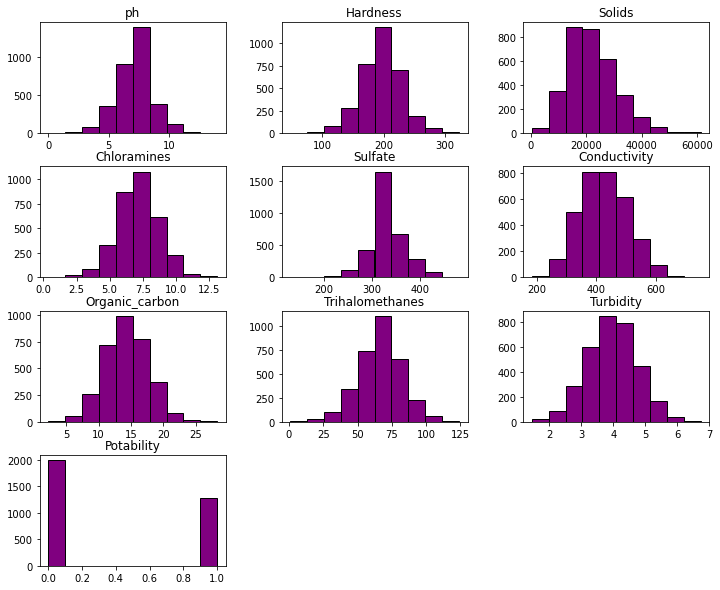

In [12]:
#Distribution graphs of the features of the dataset
df.hist(grid = False, color = 'purple', edgecolor = 'black', figsize = (12,10));

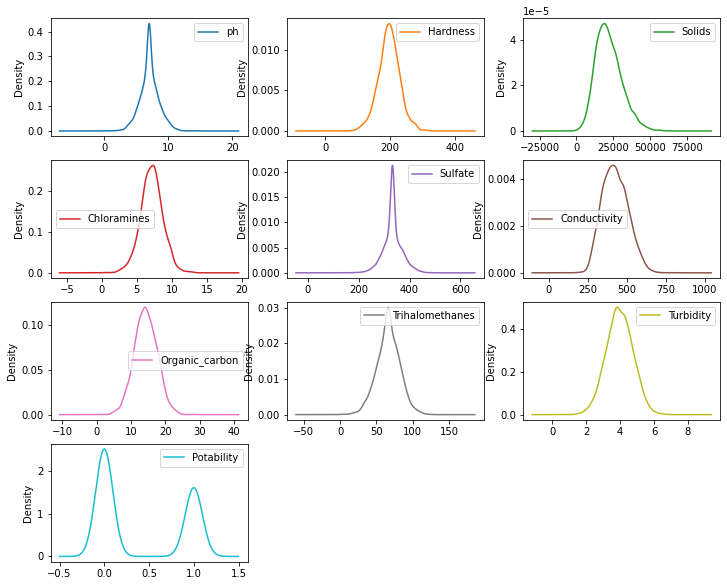

In [13]:
# density chart of the features
df.plot(kind="density", subplots=True, layout=(4,3), sharex=False, figsize=(12, 10))
plt.show()

In [14]:
# pip install --upgrade pip

In [15]:
# pip install autoviz

In [16]:
from autoviz.AutoViz_Class import AutoViz_Class
%matplotlib inline
AV = AutoViz_Class()

Imported v0.1.58. After importing, execute '%matplotlib inline' to display charts in Jupyter.
    AV = AutoViz_Class()
    dfte = AV.AutoViz(filename, sep=',', depVar='', dfte=None, header=0, verbose=1, lowess=False,
               chart_format='svg',max_rows_analyzed=150000,max_cols_analyzed=30, save_plot_dir=None)
Update: verbose=0 displays charts in your local Jupyter notebook.
        verbose=1 additionally provides EDA data cleaning suggestions. It also displays charts.
        verbose=2 does not display charts but saves them in AutoViz_Plots folder in local machine.
        chart_format='bokeh' displays charts in your local Jupyter notebook.
        chart_format='server' displays charts in your browser: one tab for each chart type
        chart_format='html' silently saves interactive HTML files in your local machine


Shape of your Data Set loaded: (3276, 10)
#######################################################################################
######################## C L A S S I F Y I N G  V A R I A B L E S  ####################
#######################################################################################
Classifying variables in data set...
Data cleaning improvement suggestions. Complete them before proceeding to ML modeling.


,Nuniques,dtype,Nulls,Nullpercent,NuniquePercent,Value counts Min,Data cleaning improvement suggestions
Hardness,3276,float64,0,0.000000,100.000000,0,
Solids,3276,float64,0,0.000000,100.000000,0,
Chloramines,3276,float64,0,0.000000,100.000000,0,
Conductivity,3276,float64,0,0.000000,100.000000,0,
Organic_carbon,3276,float64,0,0.000000,100.000000,0,
Turbidity,3276,float64,0,0.000000,100.000000,0,
Trihalomethanes,3114,float64,162,4.945055,95.054945,0,fill missing
ph,2785,float64,491,14.987790,85.012210,0,fill missing
Sulfate,2495,float64,781,23.840049,76.159951,0,fill missing
Potability,2,int64,0,0.000000,0.061050,0,


    10 Predictors classified...
        No variables removed since no ID or low-information variables found in data set
Number of All Scatter Plots = 45


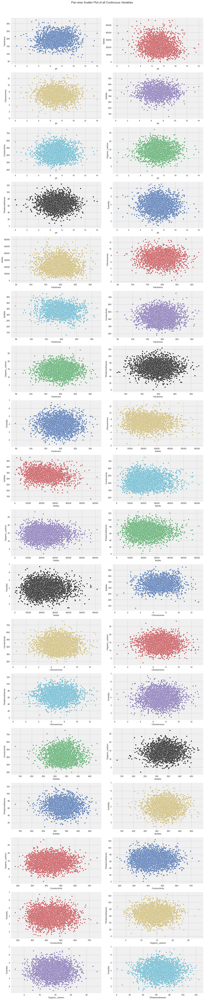

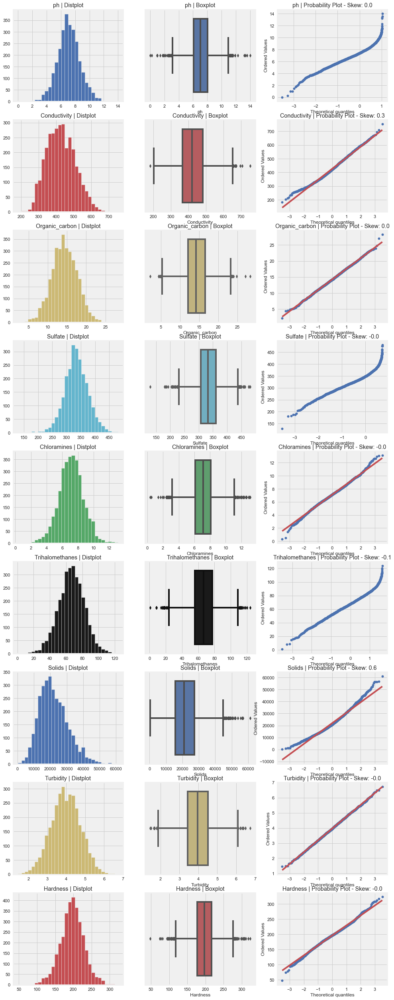

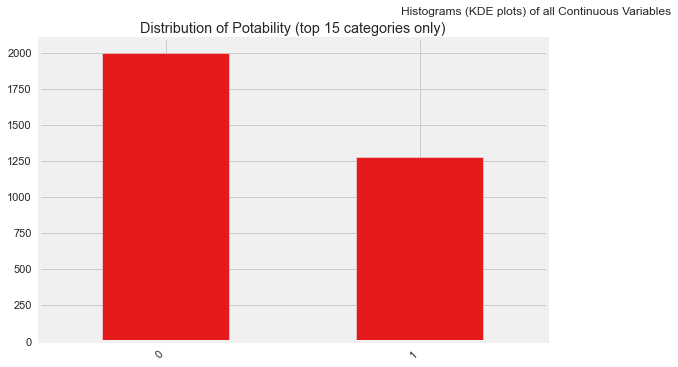

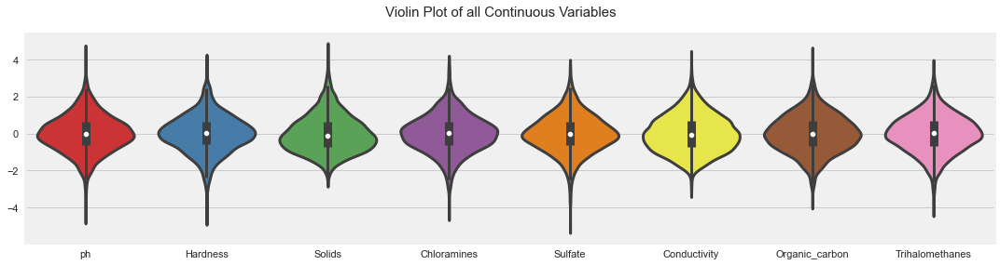

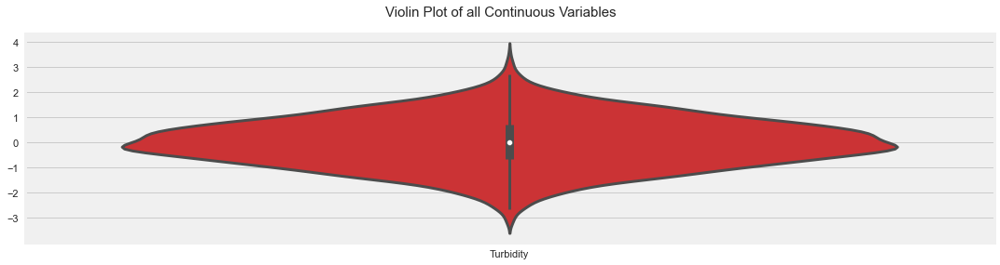

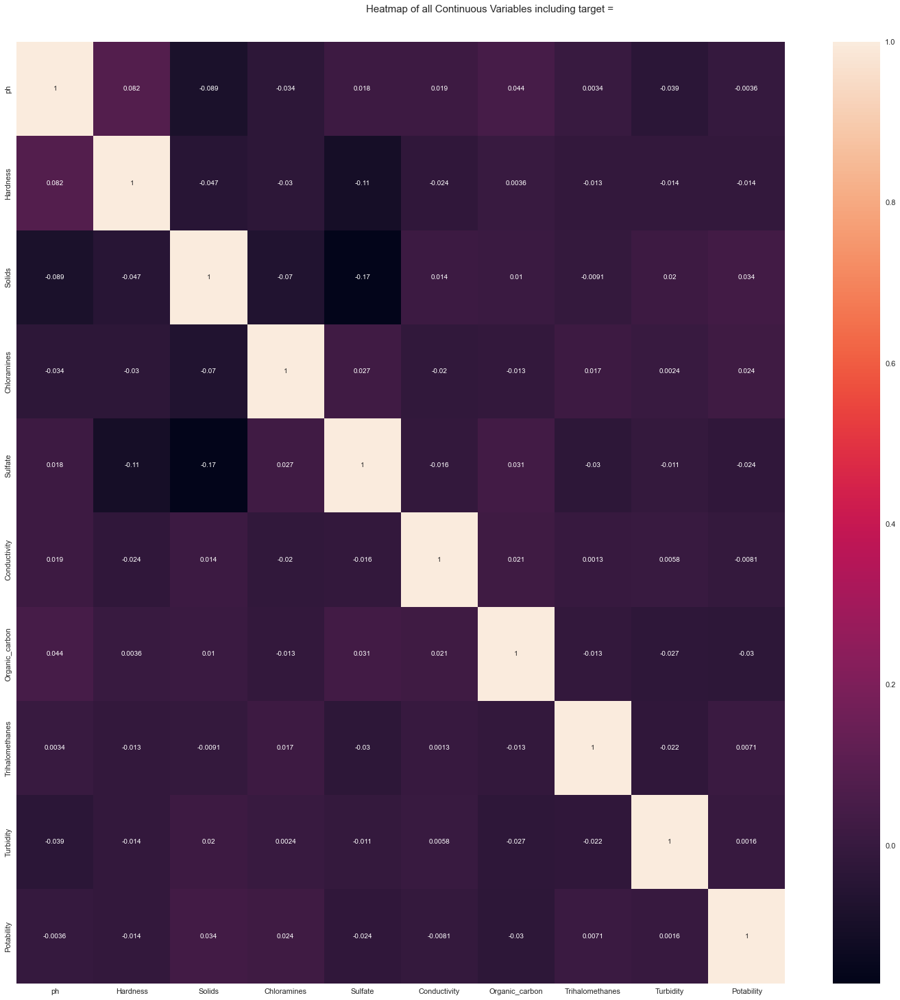

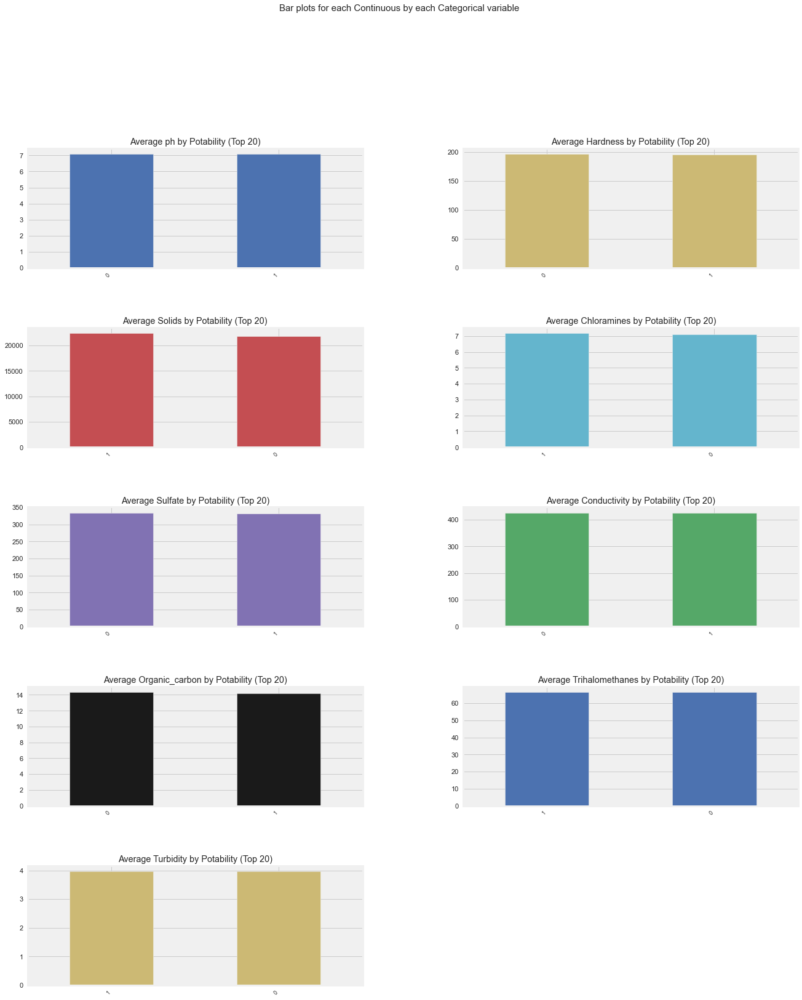

All Plots done
Time to run AutoViz = 19 seconds 

 ###################### AUTO VISUALIZATION Completed ########################


In [17]:
filename = "water_potability.csv"
sep = ","
dft = AV.AutoViz(
    filename,
    sep=",",
    depVar="",
    dfte=None,
    header=0,
    verbose=1,
    lowess=False,
    chart_format="svg",
    max_rows_analyzed=150000,
    max_cols_analyzed=30,
)

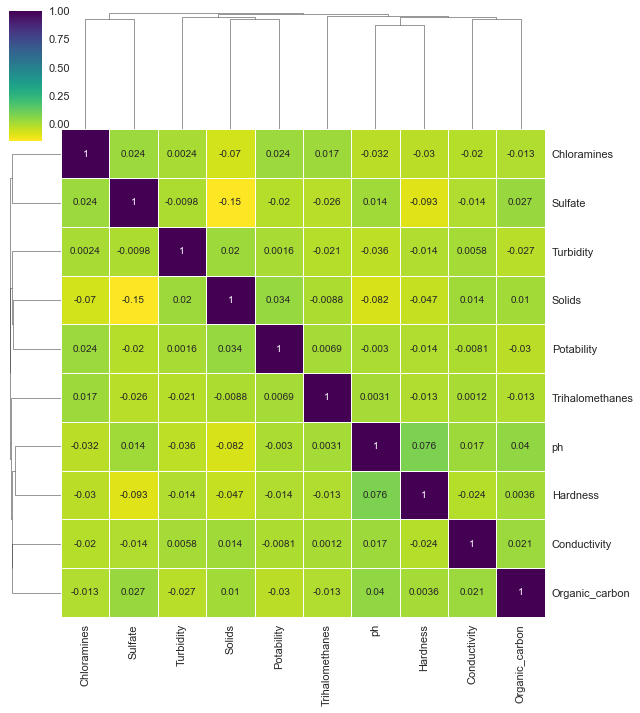

In [18]:
sns.clustermap(df.corr(), cmap = "viridis_r", dendrogram_ratio = (0.1, 0.2), annot = True, linewidths = .8, figsize = (9,10))
plt.show()

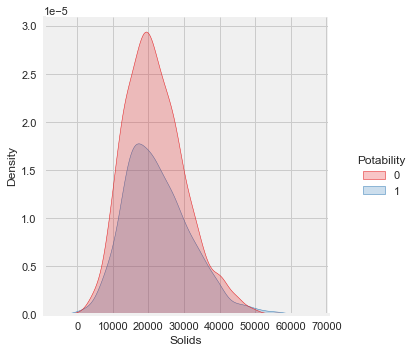

In [19]:
sns.displot(x=df['Solids'],hue=df['Potability'],kind='kde',fill=True)

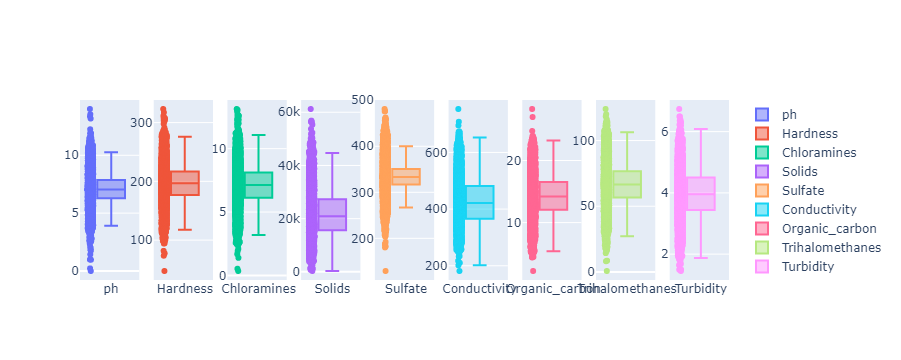

In [20]:
from plotly.subplots import make_subplots
import plotly.graph_objects as go

vars = ['ph','Hardness', 'Chloramines', 'Solids', 'Sulfate', 'Conductivity', 'Organic_carbon', 'Trihalomethanes', 'Turbidity']
fig = make_subplots(rows=1, cols=len(vars))
for i, var in enumerate(vars):
    fig.add_trace(
        go.Box(y=df[var],
        name=var),
        row=1, col=i+1
    )

fig.update_traces(boxpoints='all', jitter=0.2)

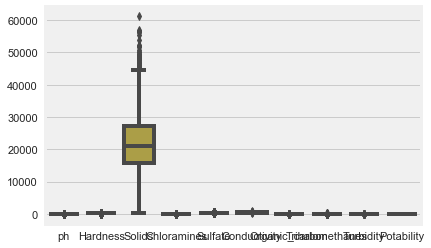

In [21]:
sns.boxplot(data = df);

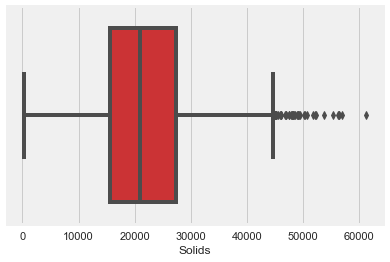

In [22]:
# display the box plot for Solids to show the outliers
sns.boxplot(df['Solids']);

<a id='modelling'></a>
## Feature Selection and Modelling

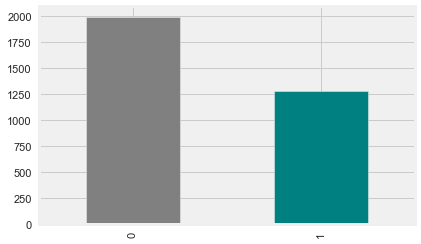

In [23]:
# display the distribution of the target variable classes
df['Potability'].value_counts().plot(kind = 'bar', color = ['gray', 'teal']);

In [24]:
# import necessary libraries and dependables
from numpy import mean
from numpy import std
from pandas import DataFrame
from pandas import read_csv
from sklearn.model_selection import RepeatedStratifiedKFold, RandomizedSearchCV, GridSearchCV, cross_val_score
from sklearn.ensemble import RandomForestClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.svm import SVR
from sklearn.tree import DecisionTreeClassifier 
from sklearn.naive_bayes import GaussianNB
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import RobustScaler
from sklearn.pipeline import Pipeline

In [27]:
def plots(df, var):
    '''
    function to display the differences between the scaled and unscaled feature
    parameters
    ---------------------------------------------
    df: dataset
    var: column to scale and plot
    '''
#     instantiate the scaler
    robust = RobustScaler()
    plt.figure(figsize = (20, 5))
    plt.subplot(1,2,1)
    sns.kdeplot(df[var])
    plt.title('Before ' + str(robust).split('(')[0])
    
    plt.subplot(1,2,2)
#     fit the column and plot
    sp2 = robust.fit_transform(df[[var]]).flatten()
    sns.kdeplot(sp2)
    plt.title('After ' + str(robust).split('(')[0])

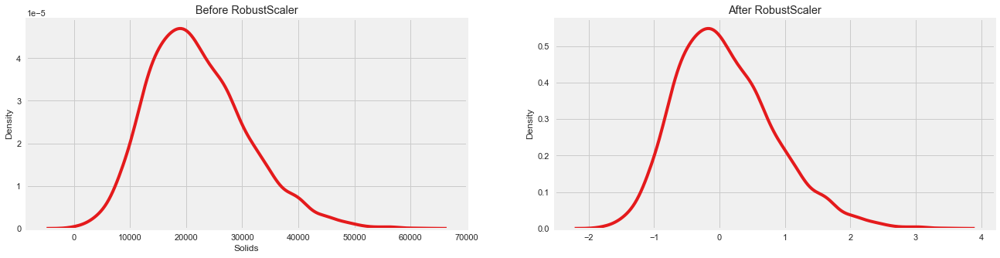

In [28]:
# call function to display the charts
plots(df, var = 'Solids')

In [29]:
# specify the independent variables and target variable
x = df.drop(['Potability'], axis = 1)
y = df['Potability']

In [30]:
# split dataset into raining and test set
x_train, x_test, y_train, y_test = train_test_split(x, y, test_size = 0.2, random_state = 42)

# check the distibution of the datasets
x_train.shape, x_test.shape, y_train.shape, y_test.shape

((2620, 9), (656, 9), (2620,), (656,))

In [31]:
# create a dictionary for the classification models
models = {'Logistic Regression': LogisticRegression(),
          'Random Forest': RandomForestClassifier(),
          'K Neighbors': KNeighborsClassifier(),
          'SVM': SVR(),
          'DecisionTreeClassifier': DecisionTreeClassifier(),
          'Naive Bayes': GaussianNB()}

In [32]:
def scaled_fit_score(models, X_train, X_test, Y_train, Y_test):
    '''
    function to fit and score machine learning models after applying scaling to fix outliers
    parameters
    ---------------------------------------------
    models: dictionary of all scikit learn machine leraning models to fit and evaluate
    X_train: training set of the predictors to fit into model
    X_test: test set of the predictors to fit into model
    Y_train: training set of the depedent varaiable
    Y_test: test set of dependent variable
    '''
#     define a random seed to make same set of prediction appear each time program is run(for reproducability)
    np.random.seed(0)
#     define a dictionary for the model scores
    scaled_model_scores = {}

#     iterate through the models dictionary items
    for name, model in models.items():
        scaled_model = Pipeline([('model', model)])
#         fit model the training set into each model in the dictionary
        scaled_model.fit(X_train, Y_train)
#     get the model score and attach it to each of the model name from model dictionary 
        scaled_model_scores[name] = scaled_model.score(X_test, Y_test)
    return scaled_model_scores

In [33]:
# call function to display the evaluation score of the models
scaled_scores = scaled_fit_score(models = models,
                  X_train = x_train,
                  Y_train = y_train,
                  X_test = x_test,
                  Y_test = y_test)
scaled_scores

{'Logistic Regression': 0.6280487804878049,
 'Random Forest': 0.6905487804878049,
 'K Neighbors': 0.5396341463414634,
 'SVM': -0.3138668687350912,
 'DecisionTreeClassifier': 0.5853658536585366,
 'Naive Bayes': 0.6280487804878049}

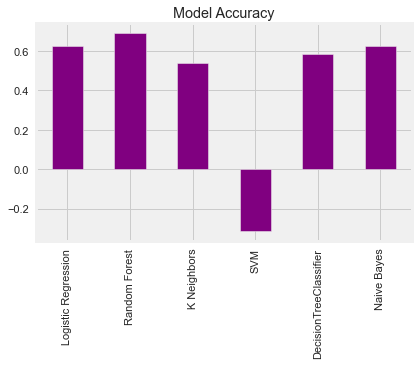

In [66]:
# display model accuracy in a chart
model_scores = DataFrame(scaled_scores, index = [0])
model_scores.T.plot.bar(title ='Model Accuracy', color = 'purple', legend = False);

In [34]:
# metrics evaluation for the model with the highest accuracy
from sklearn.metrics import classification_report

forest_model = RandomForestClassifier()
forest_model.fit(x_train, y_train)
y_predforestscaled = forest_model.predict(x_test)
print(classification_report(y_test, y_predforestscaled))

              precision    recall  f1-score   support

           0       0.69      0.87      0.77       412
           1       0.60      0.33      0.42       244

    accuracy                           0.67       656
   macro avg       0.64      0.60      0.59       656
weighted avg       0.65      0.67      0.64       656



In [35]:
# metrics evaluation for the model with the next highest accuracy
g_NB = GaussianNB()
g_NB.fit(x_train, y_train)
y_predNB = g_NB.predict(x_test)
print(classification_report(y_test, y_predNB))

              precision    recall  f1-score   support

           0       0.65      0.87      0.75       412
           1       0.50      0.21      0.30       244

    accuracy                           0.63       656
   macro avg       0.58      0.54      0.52       656
weighted avg       0.60      0.63      0.58       656



#### HYPERPARAMETER TUNING
The grid search technique will construct many versions of the model with all possible combinations of hyperparameters and will return the best one. 

RandomizedSearchCV solves the drawbacks of GridSearchCV, as it goes through only a fixed number of hyperparameter settings. It moves within the grid in a random fashion to find the best set of hyperparameters. 

In [36]:
from sklearn.model_selection import GridSearchCV
 
# Creating the hyperparameter grid
c_space = np.logspace(-5, 8, 15)
lrparam_grid = {'C': c_space}

# Instantiating logistic regression classifier
log_reg = LogisticRegression()
 
# Instantiating the GridSearchCV object
lr_gscv = GridSearchCV(log_reg, lrparam_grid, cv = 5)
 
lr_gscv.fit(x_train, y_train)

lr_gscv.best_score_

0.6053435114503818

In [37]:
# check best parameters
lr_gscv.best_params_

{'C': 1e-05}

In [38]:
from sklearn.model_selection import RandomizedSearchCV

lr_rscv = RandomizedSearchCV(log_reg, lrparam_grid, cv = 5, n_iter = 20, verbose = True)

lr_rscv.fit(x_train, y_train)

lr_rscv.best_score_

Fitting 5 folds for each of 15 candidates, totalling 75 fits


0.6053435114503818

In [39]:
lr_rscv.best_params_

{'C': 1e-05}

In [40]:
# Creating the hyperparameter grid
rfparam_grid = {'n_estimators': np.arange(10, 1000, 50),
              'max_depth': [None, 3, 5, 10],
              'min_samples_split': np.arange(2, 20, 2),
              'min_samples_leaf': np.arange(1, 20, 2),
              }
 
# Instantiating Random Forest classifier
forest = RandomForestClassifier()
 
# Instantiating RandomizedSearchCV object
rf_rscv = RandomizedSearchCV(forest, rfparam_grid, cv = 5, n_iter = 30, verbose = True)
 
rf_rscv.fit(x_train, y_train)
 
# Print the tuned parameters and score
rf_rscv.best_params_

Fitting 5 folds for each of 30 candidates, totalling 150 fits


{'n_estimators': 710,
 'min_samples_split': 10,
 'min_samples_leaf': 1,
 'max_depth': None}

In [41]:
rf_rscv.best_score_

0.6767175572519084

<a id='modelling'></a>
## METRICS EVALUATION

Evaluating tuned classifier models

In [44]:
from sklearn.metrics import classification_report, confusion_matrix

In [45]:
# metrics evaluation on tuned model with best score
y_predrf = rf_rscv.predict(x_test)
report = classification_report(y_test, y_predrf)
print(report)

              precision    recall  f1-score   support

           0       0.70      0.90      0.79       412
           1       0.67      0.36      0.47       244

    accuracy                           0.70       656
   macro avg       0.69      0.63      0.63       656
weighted avg       0.69      0.70      0.67       656



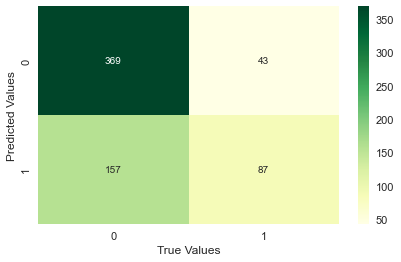

In [49]:
sns.heatmap((confusion_matrix(y_test,y_predrf)),annot=True,fmt='.5g',cmap="YlGn");
plt.xlabel('True Values')
plt.ylabel('Predicted Values');


#### Cross Validation Evaluation
To assure that our model got the correct patterns from the data, and it is not getting up too much noise, we use the cross-validation technique. Since we couldn’t fit the model on the training data and can’t say for sure that the model will work accurately for the real data.

In [50]:
# import libraries and modules
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import RepeatedStratifiedKFold

In [51]:
rnd_model = RandomForestClassifier(n_estimators = 710, min_samples_split = 10, min_samples_leaf = 1, max_depth = None)
cv = RepeatedStratifiedKFold(n_splits=10, n_repeats=3, random_state=1)

In [52]:
score_acc = cross_val_score(rnd_model, x, y, scoring='accuracy', cv=cv)
print('Accuracy is: ', mean(score_acc))

Accuracy is:  0.6762350513413391


In [53]:
score_precision = cross_val_score(rnd_model, x, y, scoring='precision', cv=cv)
print('Precision is: ', mean(score_precision))

Precision is:  0.6678000208444811


In [54]:
score_recall = cross_val_score(rnd_model, x, y, scoring='recall', cv=cv)
print('Recall is: ', mean(score_recall))

Recall is:  0.3385314140419947


In [55]:
score_f1 = cross_val_score(rnd_model, x, y, scoring='f1', cv=cv)
print('F1 is: ', mean(score_f1))

F1 is:  0.4465656420820066


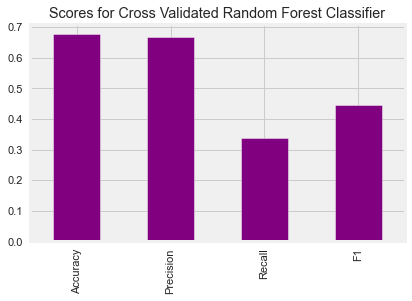

In [56]:
# to visualize the scores

cross_valdf = pd.DataFrame({'Accuracy': mean(score_acc),
                            'Precision': mean(score_precision),
                            'Recall': mean(score_recall),
                            'F1': mean(score_f1)}, index = [0])

cross_valdf.T.plot.bar(title ='Scores for Cross Validated Random Forest Classifier', color = 'purple', legend = False);                          

#### Feature Importance Review
Feature importance indicates how much each feature contributes to the model prediction. It determines the degree of usefulness of a specific variable for a current model and prediction.

In [57]:
rnd_model = RandomForestClassifier(n_estimators = 210, min_samples_split = 12, min_samples_leaf = 3, max_depth = None)

In [58]:
rnd_model.fit(x_train, y_train)
feat = rnd_model.feature_importances_

feat

array([0.13603064, 0.12622808, 0.11045565, 0.11379771, 0.14073823,
       0.09363024, 0.09434039, 0.09422451, 0.09055454])

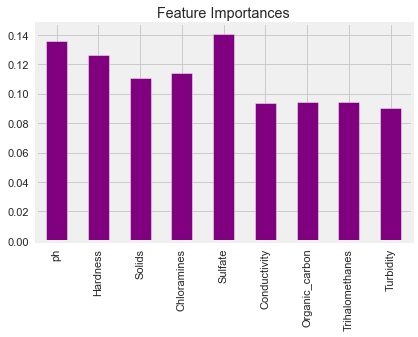

In [59]:
feat_importance = DataFrame(feat, index = df.drop(['Potability'], axis = 1).columns)
# visualize the feature importance
feat_importance.plot.bar(title ='Feature Importances', color = 'purple', legend = False);

<a id='conclusions'></a>
## CONCLUSION
After carefully cleaning the dataset, fixing outliers and further analysis, the cleaned dataset was fitted to a series of classification machine learning models to get the model with the highest accuracy. Out of those models, RandomForestClassifier() algorithm had the highest accuracy followed by Gaussian Naive Bayes algorithm and Logistic Regression. 